In [15]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Open annotated propaganda tweets

In [16]:
# file available upon request
with open('../../../data/tweets_vips_annotated.json') as f:
    propaganda_tweets = json.load(f)

Open file with political representatives handles

In [17]:
# file available upon request
vips = pd.read_csv("../../../data/twitter_representatives_handles_final.csv")

Add info on author and party to annotated tweets

In [18]:
tweets = []
for tweet in propaganda_tweets:
    tweet_id = tweet
    created_at = propaganda_tweets[tweet]['created_at']
    author_id = propaganda_tweets[tweet]['author_id']
    party = vips[vips['ids'] == author_id]['Party'].values[0]
    name = vips[vips['ids'] == author_id]['Name'].values[0]
    if "annotations" not in propaganda_tweets[tweet]:
        continue
    annotations = [sub["label"] for sub in propaganda_tweets[tweet]['annotations']]
    tweets.append([tweet_id, created_at, author_id, party, name, annotations])

df = pd.DataFrame(tweets, columns=['tweet_id', 'created_at', 'author_id', 'party', 'name', 'annotations'])

Define reference swing periods

In [19]:
start_before = '2022-07-01'
start_during = '2022-08-26'
start_after = '2022-09-25'
end_after = '2022-10-31'

In [20]:
# create "period" column conditional on created_at
df['period'] = 'before'
df.loc[df['created_at'] >= start_during, 'period'] = 'during'
df.loc[df['created_at'] >= start_after, 'period'] = 'after'

# Techniques by representatives

In [21]:
# compute baseline of % of tweets containing each annotation
total_tweets = len(df)
total_annotations = df['annotations'].explode().count()
baseline = df['annotations'].explode().value_counts() / total_annotations
baseline

Doubt                               0.290593
Loaded_Language                     0.113754
Slogans                             0.113407
Appeal_to_Values                    0.105099
Questioning_the_Reputation          0.080585
Conversation_Killer                 0.072719
Flag_Waving                         0.053955
Name_Calling-Labeling               0.053702
Appeal_to_Hypocrisy                 0.028589
False_Dilemma-No_Choice             0.022113
Appeal_to_Fear-Prejudice            0.019649
Appeal_to_Time                      0.010930
Straw_Man                           0.007202
Appeal_to_Popularity                0.006792
Exaggeration-Minimisation           0.006350
Causal_Oversimplification           0.004486
Repetition                          0.002843
Guilt_by_Association                0.002464
Appeal_to_Authority                 0.001327
Consequential_Oversimplification    0.001264
Obfuscation-Vagueness-Confusion     0.001232
Red_Herring                         0.000758
Whatabouti

In [8]:
# get list of unique techniques
techniques = df['annotations'].explode().unique()
techniques

array(['Slogans', 'Conversation_Killer', 'Questioning_the_Reputation',
       'Name_Calling-Labeling', 'Doubt', 'Loaded_Language',
       'Appeal_to_Values', 'Appeal_to_Time', 'Exaggeration-Minimisation',
       'Appeal_to_Hypocrisy', 'False_Dilemma-No_Choice',
       'Appeal_to_Fear-Prejudice', 'Flag_Waving',
       'Consequential_Oversimplification', 'Appeal_to_Popularity',
       'Causal_Oversimplification', 'Repetition', 'Straw_Man',
       'Appeal_to_Authority', 'Whataboutism',
       'Obfuscation-Vagueness-Confusion', 'Red_Herring',
       'Guilt_by_Association'], dtype=object)

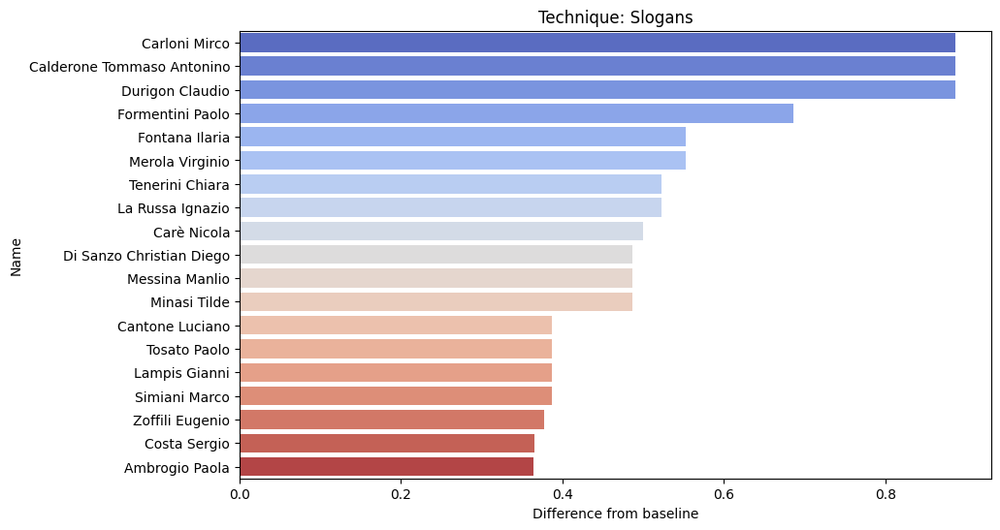

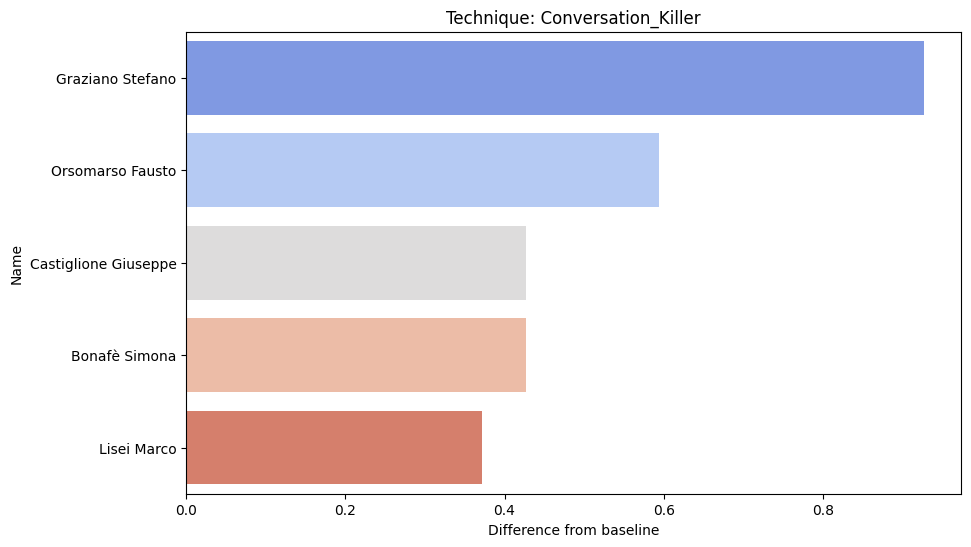

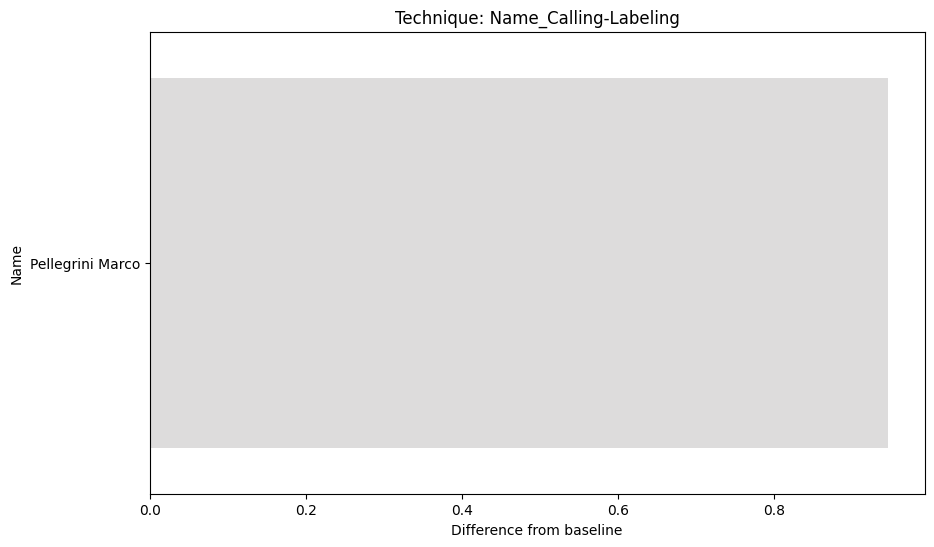

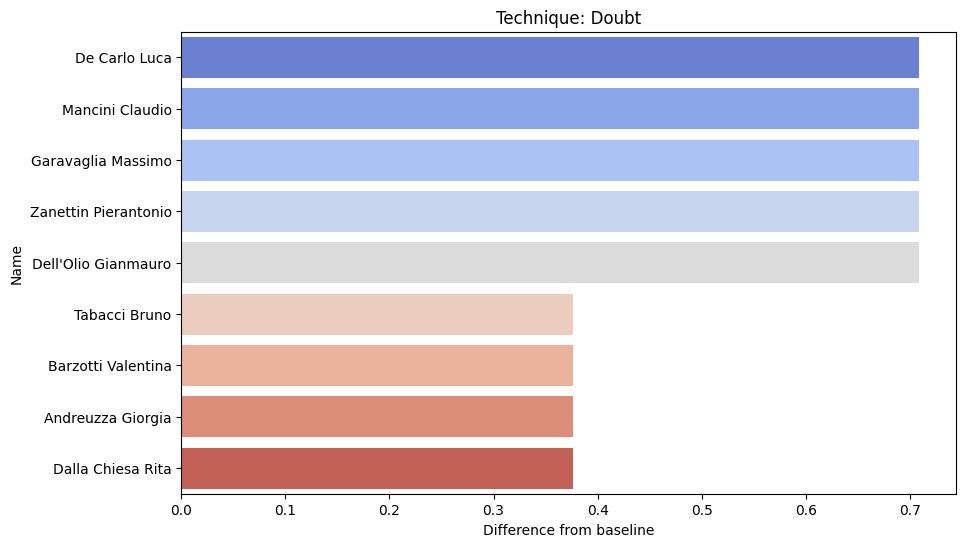

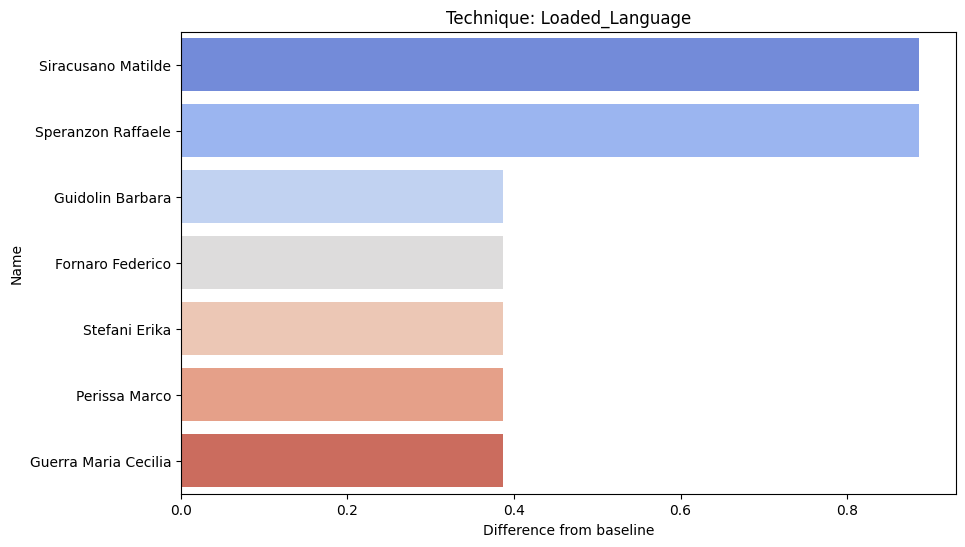

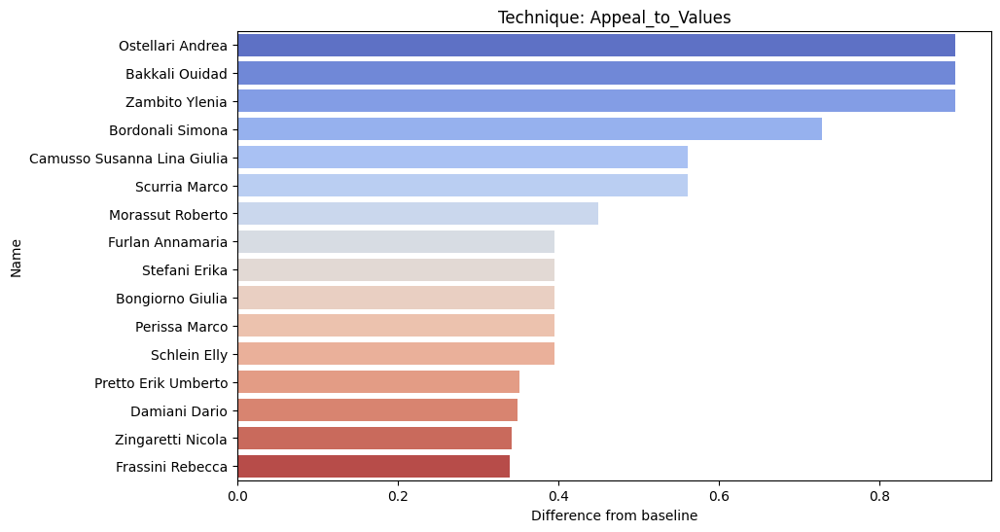

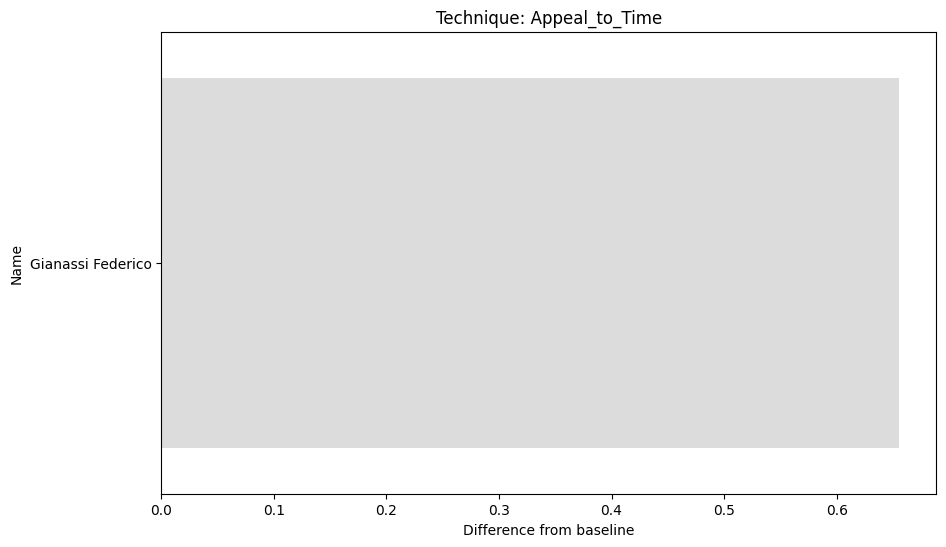

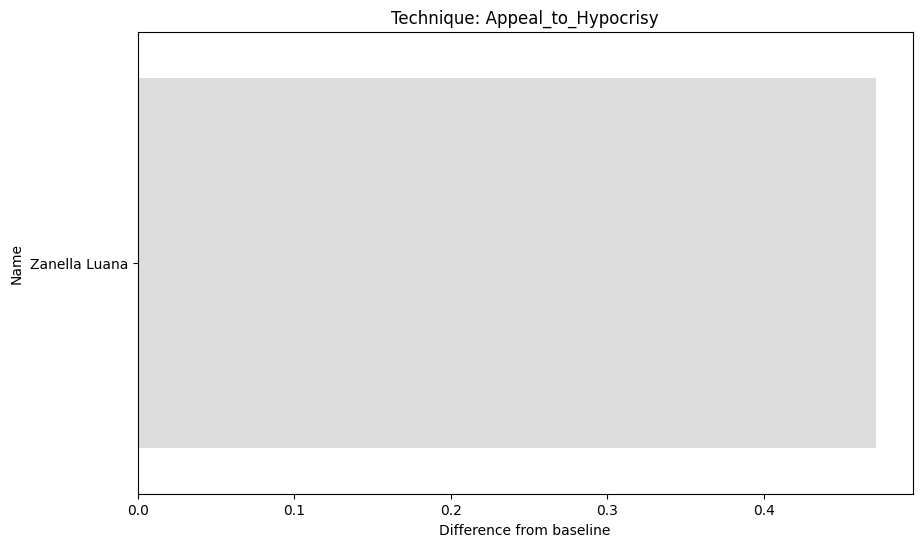

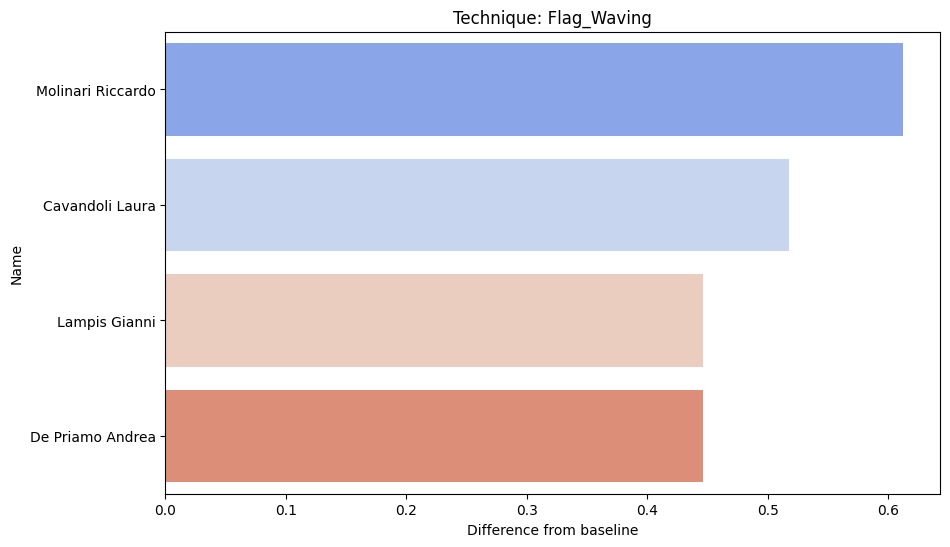

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize empty dictionaries to store data for each party
# Iterate over unique parties
for tech in techniques:
    list_tech_names = []
    for name in df["name"].unique():
        name_annotations = df[df["name"] == name]["annotations"].explode().value_counts()

        # Compute % of tweets containing each annotation by name
        name_annotations_tot = df[df["name"] == name]["annotations"].explode().count()
        name_annotations_perc = name_annotations / name_annotations_tot

        # Compute the difference between party_annotations_perc and baseline
        name_diff = name_annotations_perc - baseline

        # get the difference for the technique
        if tech in name_diff:
            diff = name_diff[tech]
        else:
            diff = 0

        # transform diff = nan to 0
        if pd.isna(diff):
            diff = 0

        if abs(diff) < 0.33:
            continue

        list_tech_names.append([name, diff])


    palette = sns.color_palette("coolwarm", as_cmap=True)


    # plot the difference for the technique
    if len(list_tech_names) > 0:
        df_tech = pd.DataFrame(list_tech_names, columns=["name", "diff"])
        df_tech = df_tech.sort_values("diff", ascending=False)
        plt.figure(figsize=(10, 6))
        
        sns.barplot(x="diff", y="name", data=df_tech, palette="coolwarm")
        plt.title(f"Technique: {tech}")
        plt.xlabel("Difference from baseline")
        plt.ylabel("Name")
        plt.show()
        

# Techniques by representatives and periods

## Before-during

In [22]:
# representatives that are active both before and during
df_before = df[df['period'] == 'before']
df_during = df[df['period'] == 'during']

# get list of names that are active both before and during
names_before = df_before['name'].unique()
names_during = df_during['name'].unique()

names_interest_bd = ["Marattin Luigi", "Faraone Davide", "Cottarelli Carlo",
                    "Berlusconi Silvio", "Zan Alessandro", "Bagnai Alberto",
                    "Conte Giuseppe", "Bonetti Elena", "Soumahoro Aboubakar",
                    "Richetti Matteo", "Renzi Matteo", "Paita Raffaella", 
                    "Boschi Maria Elena", "Calenda Carlo", "Scalfarotto Ivan"]


In [23]:
pre = "Before"
post = "During"

In [24]:
# baseline before
total_annotations_before = df[df["period"] == "before"]['annotations'].explode().count()
baseline_before = df[df["period"] == "before"]['annotations'].explode().value_counts() / total_annotations_before
baseline_before

Doubt                               0.295296
Loaded_Language                     0.109732
Appeal_to_Values                    0.098707
Slogans                             0.098501
Questioning_the_Reputation          0.088507
Conversation_Killer                 0.075112
Name_Calling-Labeling               0.057545
Flag_Waving                         0.052857
Appeal_to_Hypocrisy                 0.032353
False_Dilemma-No_Choice             0.022977
Appeal_to_Fear-Prejudice            0.019216
Appeal_to_Time                      0.011076
Straw_Man                           0.007728
Appeal_to_Popularity                0.007367
Exaggeration-Minimisation           0.006079
Causal_Oversimplification           0.004946
Repetition                          0.004018
Guilt_by_Association                0.002833
Consequential_Oversimplification    0.001597
Appeal_to_Authority                 0.001546
Obfuscation-Vagueness-Confusion     0.000927
Red_Herring                         0.000773
Whatabouti

In [25]:
# baseline during
total_annotations_during = df[df["period"] == "during"]['annotations'].explode().count()
baseline_during = df[df["period"] == "during"]['annotations'].explode().value_counts() / total_annotations_during
baseline_during

Doubt                               0.273608
Slogans                             0.147563
Appeal_to_Values                    0.116969
Loaded_Language                     0.116255
Conversation_Killer                 0.070263
Questioning_the_Reputation          0.066082
Flag_Waving                         0.057924
Name_Calling-Labeling               0.044463
Appeal_to_Hypocrisy                 0.023353
Appeal_to_Fear-Prejudice            0.022129
False_Dilemma-No_Choice             0.021415
Appeal_to_Time                      0.011320
Straw_Man                           0.006527
Exaggeration-Minimisation           0.006323
Appeal_to_Popularity                0.004793
Causal_Oversimplification           0.003671
Guilt_by_Association                0.001734
Obfuscation-Vagueness-Confusion     0.001632
Repetition                          0.001224
Appeal_to_Authority                 0.001122
Red_Herring                         0.000918
Consequential_Oversimplification    0.000714
Name: anno

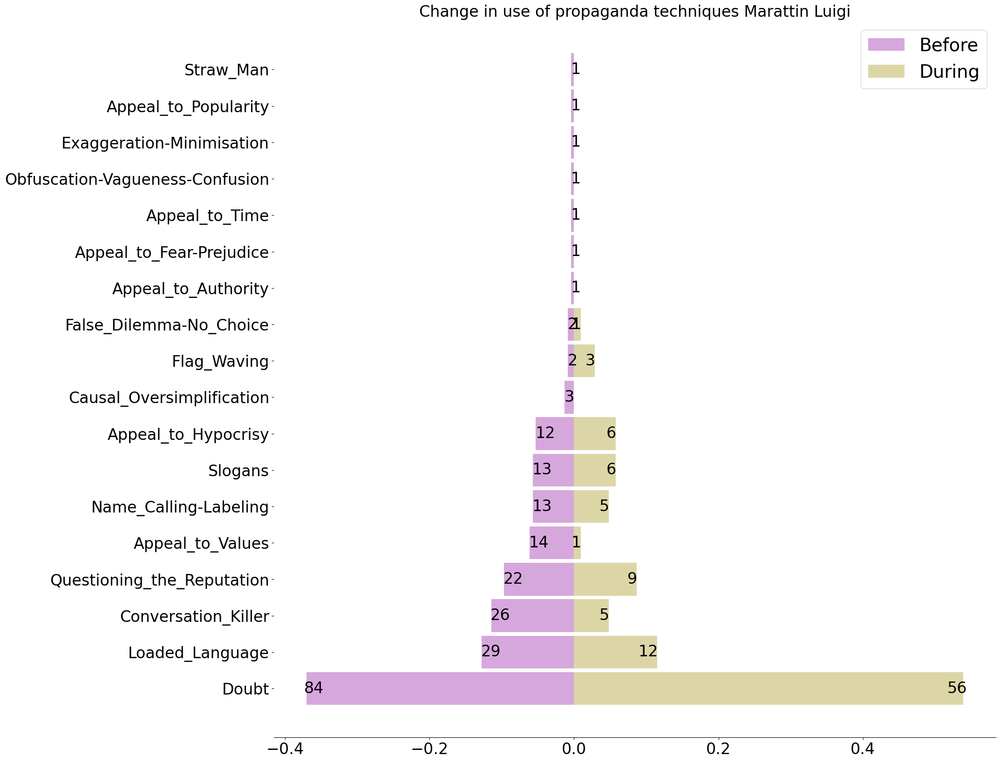

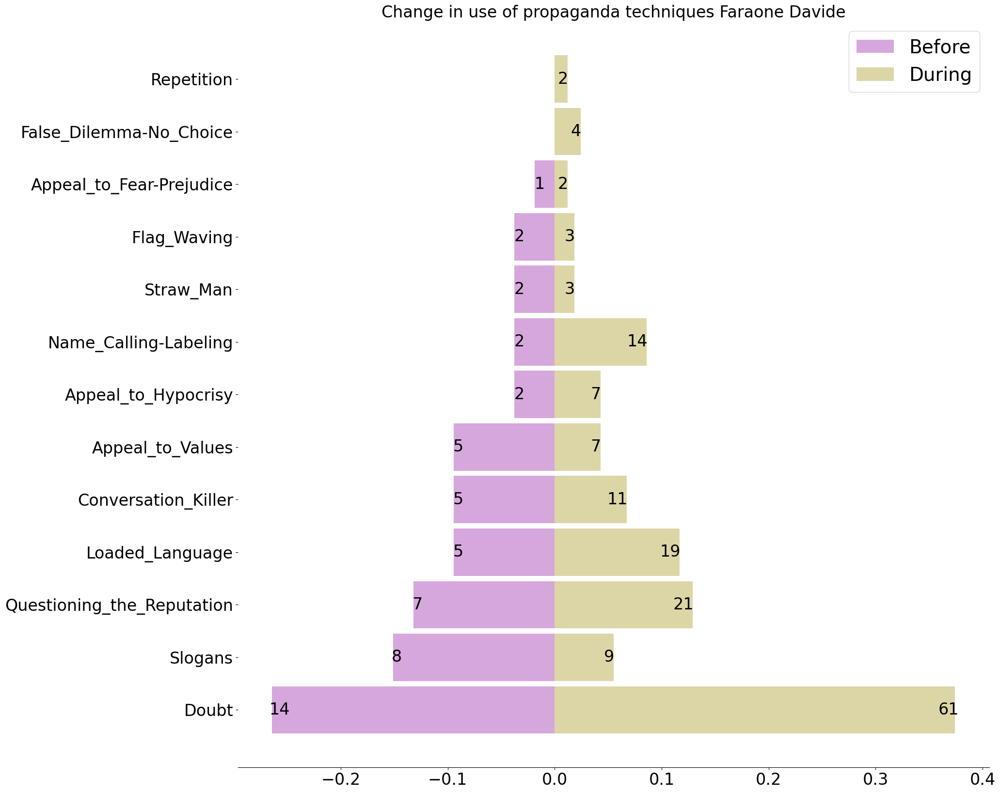

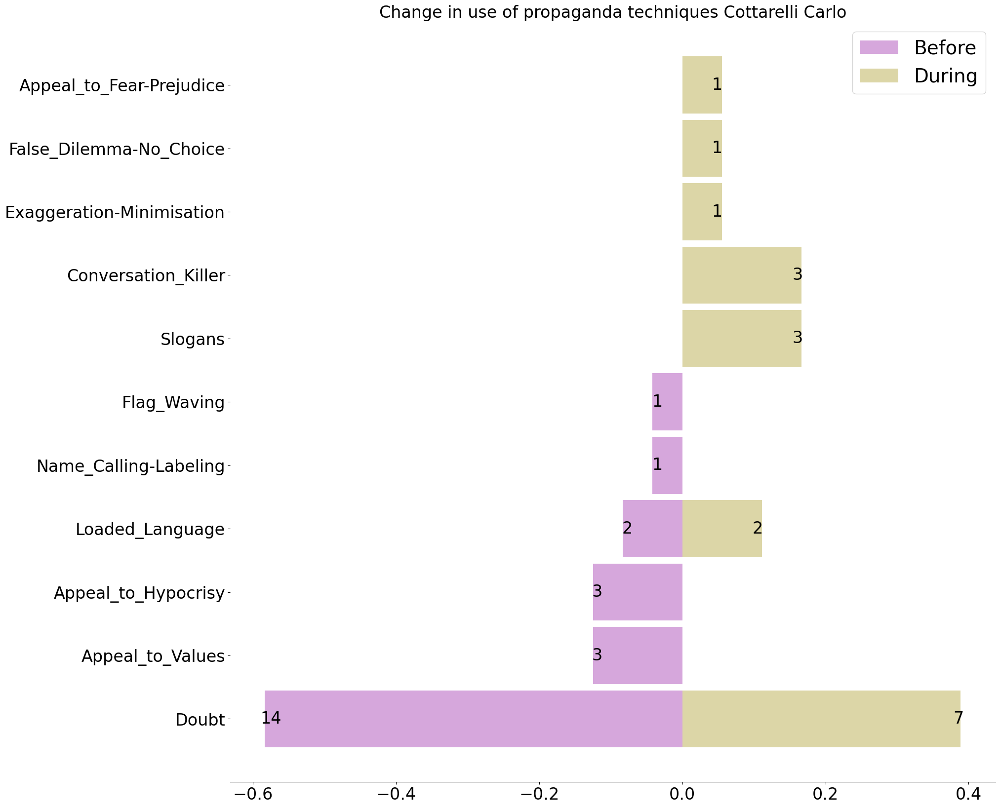

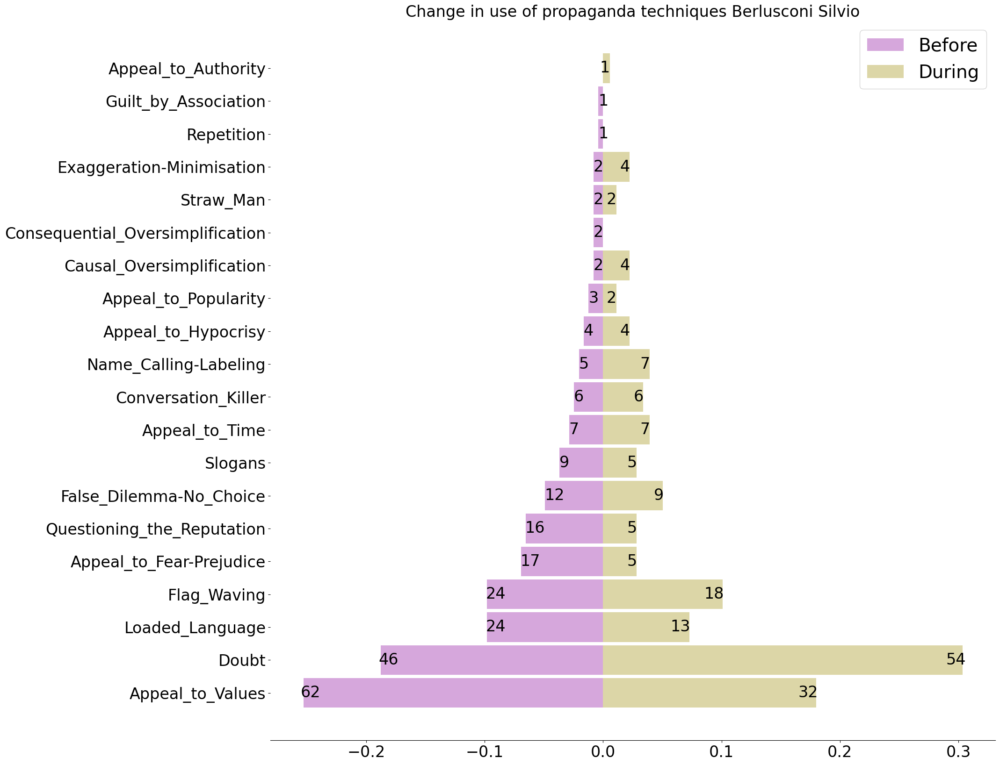

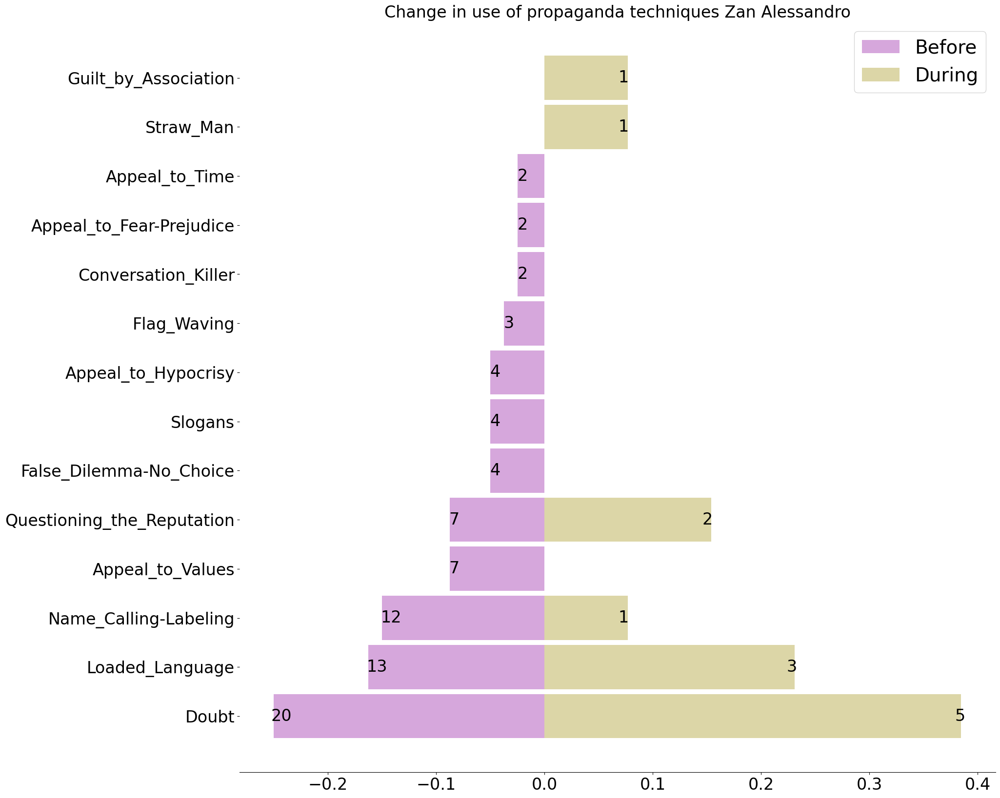

...

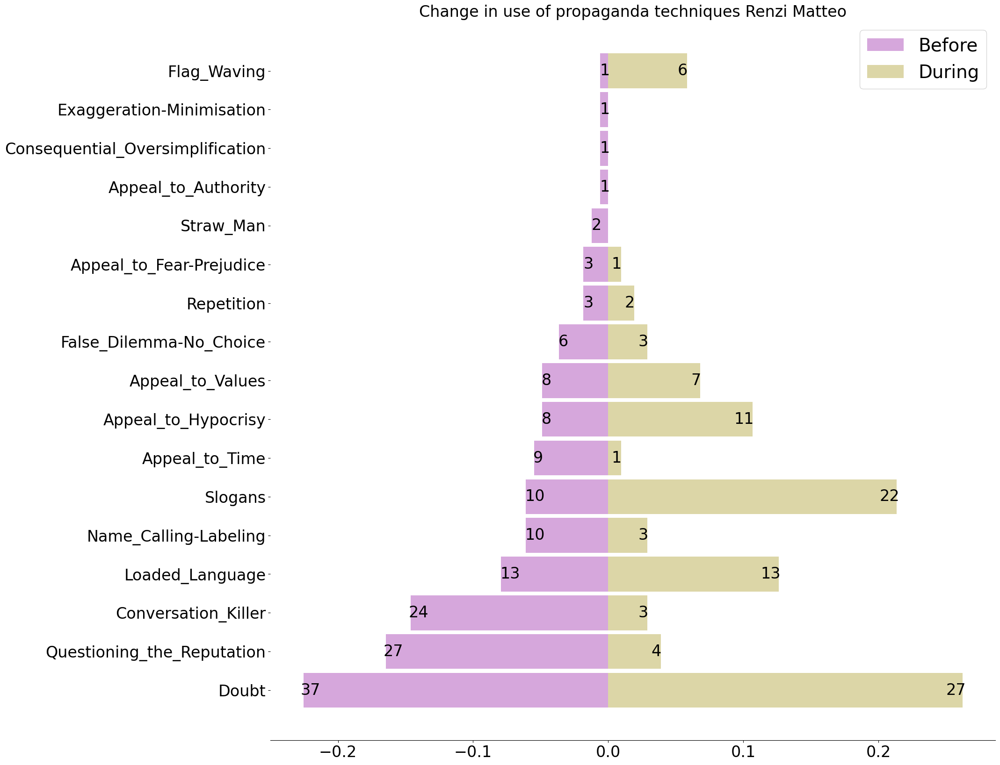

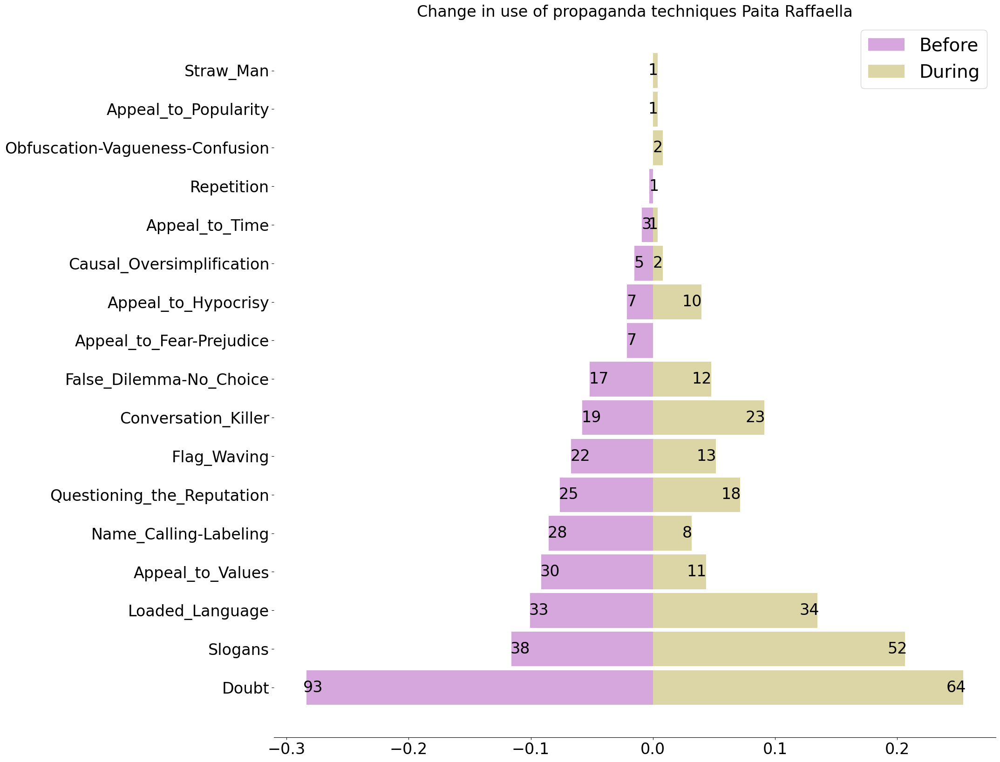

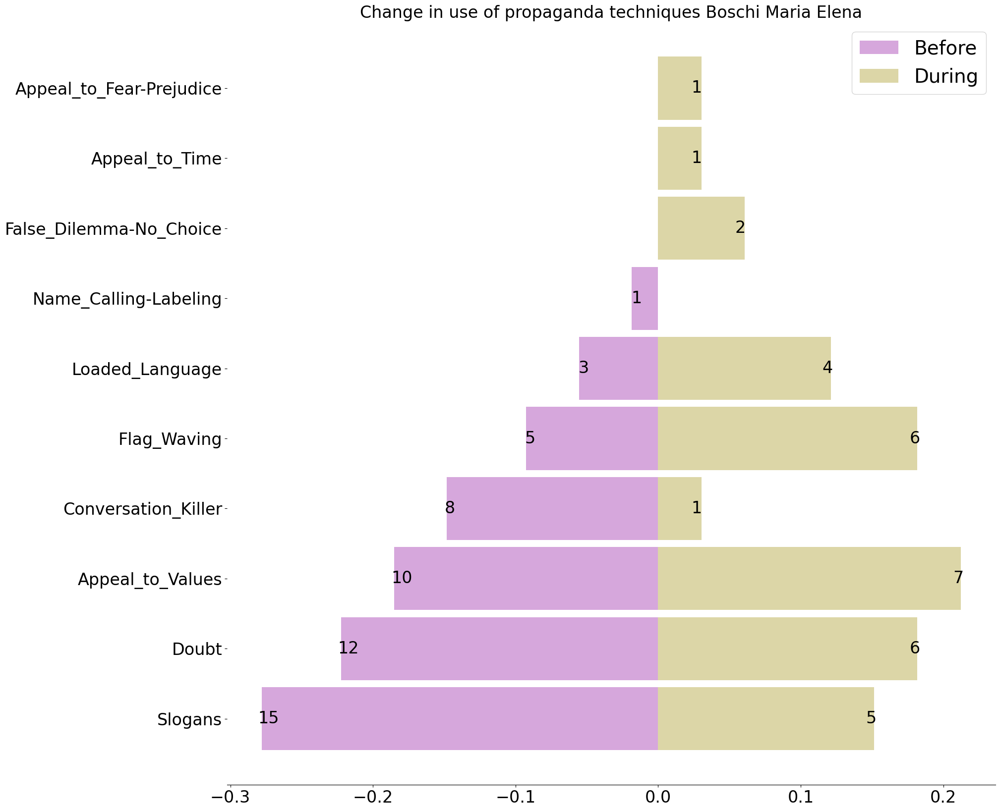

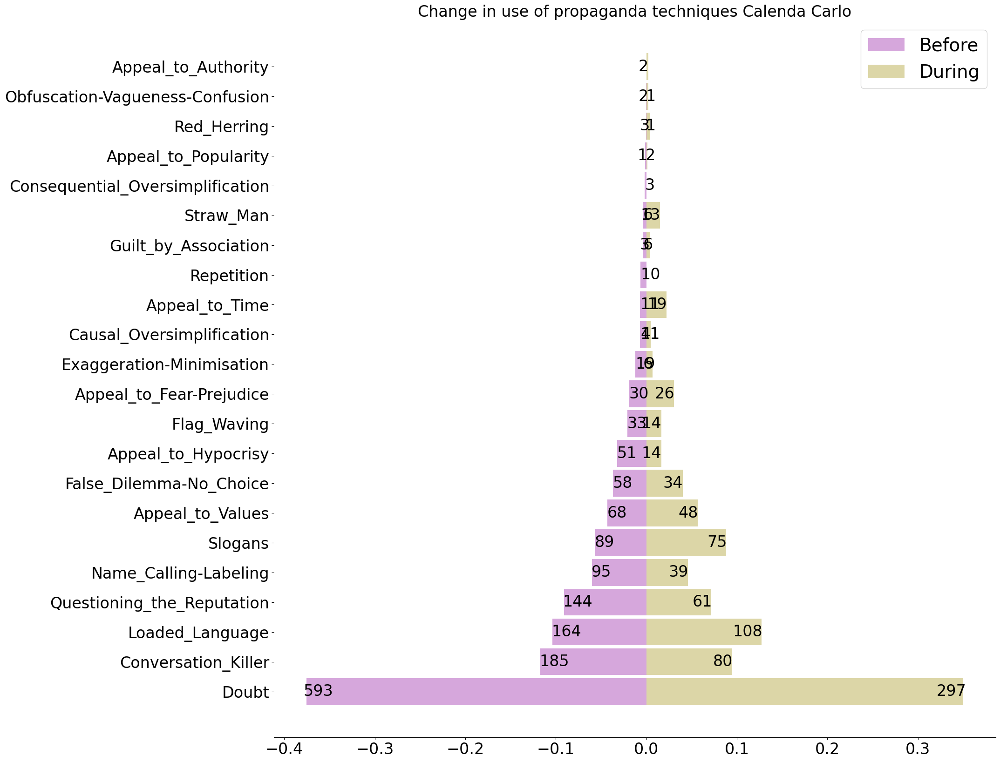

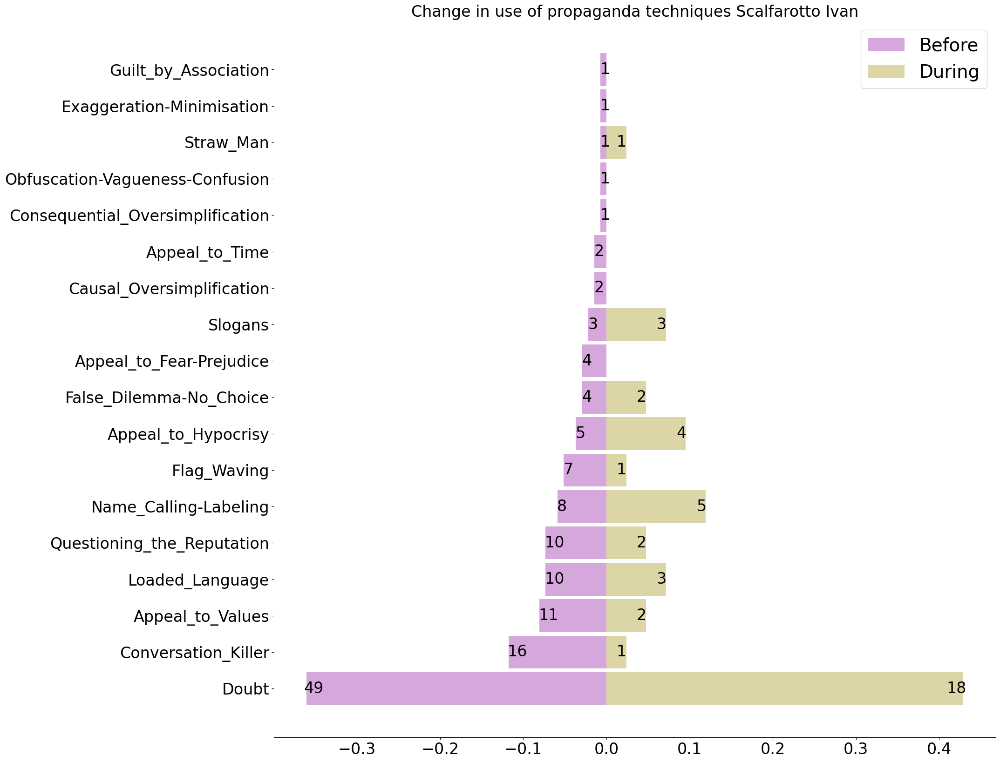

In [26]:
for name in names_interest_bd:

    # before
    name_annotations_before = df[(df["name"] == name) & (df["period"] == "before")]["annotations"].explode().value_counts()
    # during
    name_annotations_during = df[(df["name"] == name) & (df["period"] == "during")]["annotations"].explode().value_counts()

    perc_name_ann_before = name_annotations_before/df[(df["name"] == name) & (df["period"] == "before")]["annotations"].explode().count()
    perc_name_ann_during = name_annotations_during/df[(df["name"] == name) & (df["period"] == "during")]["annotations"].explode().count()

    # Create a figure and axis with a specific size
    fig, ax = plt.subplots(figsize=(20,20))
    
    if pre == "Before":
        colorpre = '#BC6DC5'
    else:
        colorpre = '#C5BC6D'

    if post == "During":
        colorpost = '#C5BC6D'
    else:
        colorpost = '#6DC5BC'

    # Create both barplots
    before_bars = ax.barh(perc_name_ann_before.index, -perc_name_ann_before,
                          color=colorpre, alpha=0.6, label=pre, height=0.9)
    during_bars = ax.barh(perc_name_ann_during.index, perc_name_ann_during,
                          color=colorpost, alpha=0.6, label=post, height=0.9)

    # Add annotations at the end of each bar
    for bar, annotations in zip(before_bars, name_annotations_before):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='left', color='black', fontsize=24)

    for bar, annotations in zip(during_bars, name_annotations_during):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='right', color='black', fontsize=24)

    # Removes spines
    ax.spines[['right', 'top', 'left']].set_visible(False)

    # Add a title
    ax.set_title('Change in use of propaganda techniques '+name, fontsize=24)

    # ticks size
    ax.tick_params(axis='y', labelsize=24)
    ax.tick_params(axis='x', labelsize=24)

    plt.legend(fontsize=28)

    # Display the plot
    plt.show()

## During-after

In [27]:
# representatives that are active both before and during
df_during = df[df['period'] == 'during']
df_after = df[df['period'] == 'after']

# get list of names that are active both before and during
names_during = df_during['name'].unique()
names_after = df_after['name'].unique()

names_interest_da = ["Renzi Matteo", "Letta Enrico", "Boldrini Laura",
                    "Rosato Ettore", "Evi Eleonora", "Cottarelli Carlo",
                    "Bonetti Elena", "Marattin Luigi", "Zan Alessandro",
                    "Bonifazi Francesco", "Calenda Carlo", "Fratoianni Nicola",
                    "Fina Michele", "Delmastro Delle Vedove Andrea", "Conte Giuseppe",
                    "Faraone Davide"]


In [28]:
pre = "During"
post = "After"

In [29]:
# baseline before
total_annotations_after = df[df["period"] == "after"]['annotations'].explode().count()
baseline_after = df[df["period"] == "after"]['annotations'].explode().value_counts() / total_annotations_after
baseline_after

Doubt                               0.321443
Loaded_Language                     0.135711
Appeal_to_Values                    0.108241
Slogans                             0.094711
Questioning_the_Reputation          0.075851
Conversation_Killer                 0.063551
Name_Calling-Labeling               0.060271
Flag_Waving                         0.046740
Appeal_to_Hypocrisy                 0.019680
False_Dilemma-No_Choice             0.018040
Appeal_to_Fear-Prejudice            0.013120
Appeal_to_Popularity                0.010250
Exaggeration-Minimisation           0.008610
Appeal_to_Time                      0.008200
Straw_Man                           0.005740
Causal_Oversimplification           0.004100
Guilt_by_Association                0.002460
Obfuscation-Vagueness-Confusion     0.002050
Consequential_Oversimplification    0.000820
Appeal_to_Authority                 0.000410
Name: annotations, dtype: float64

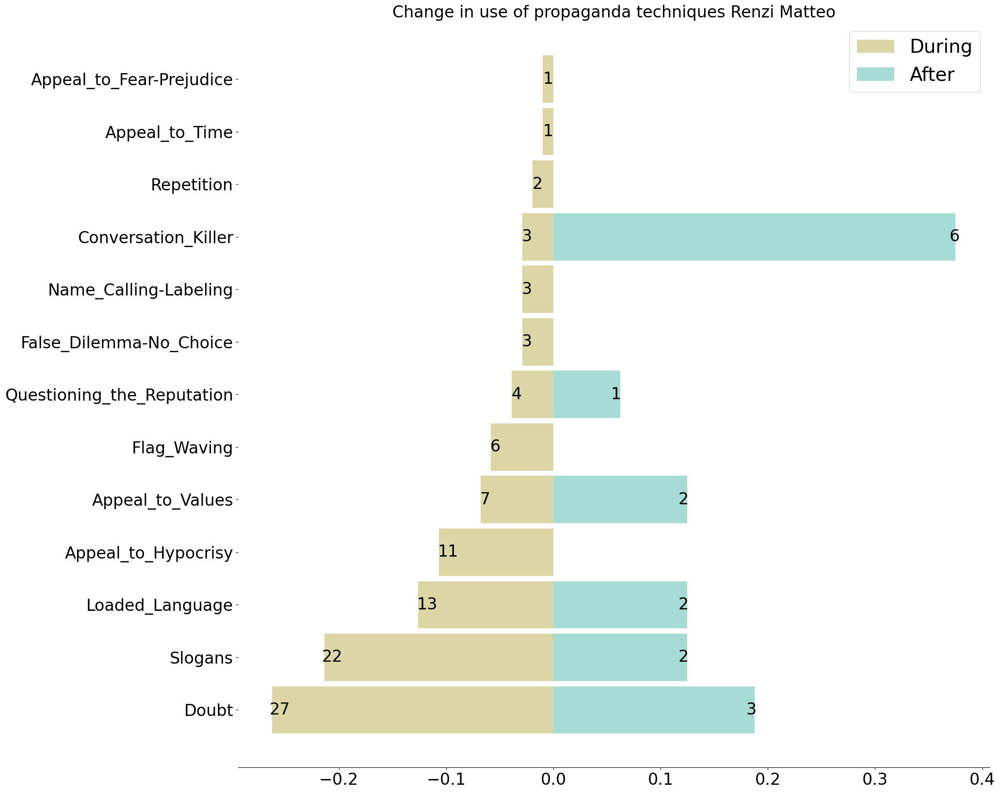

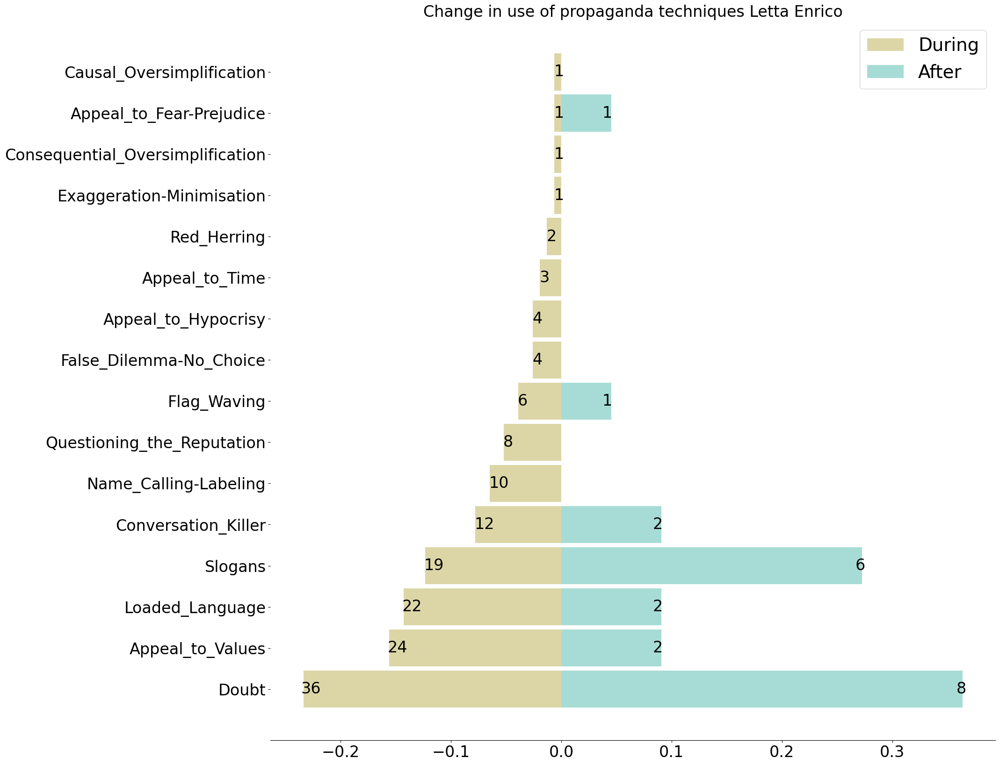

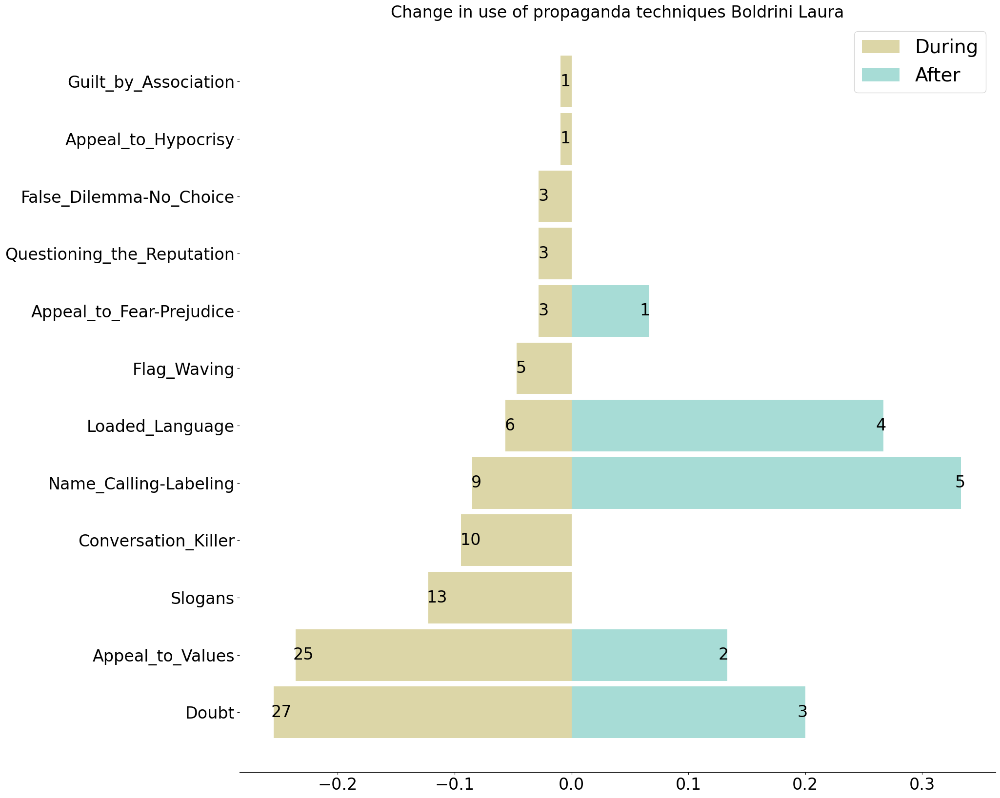

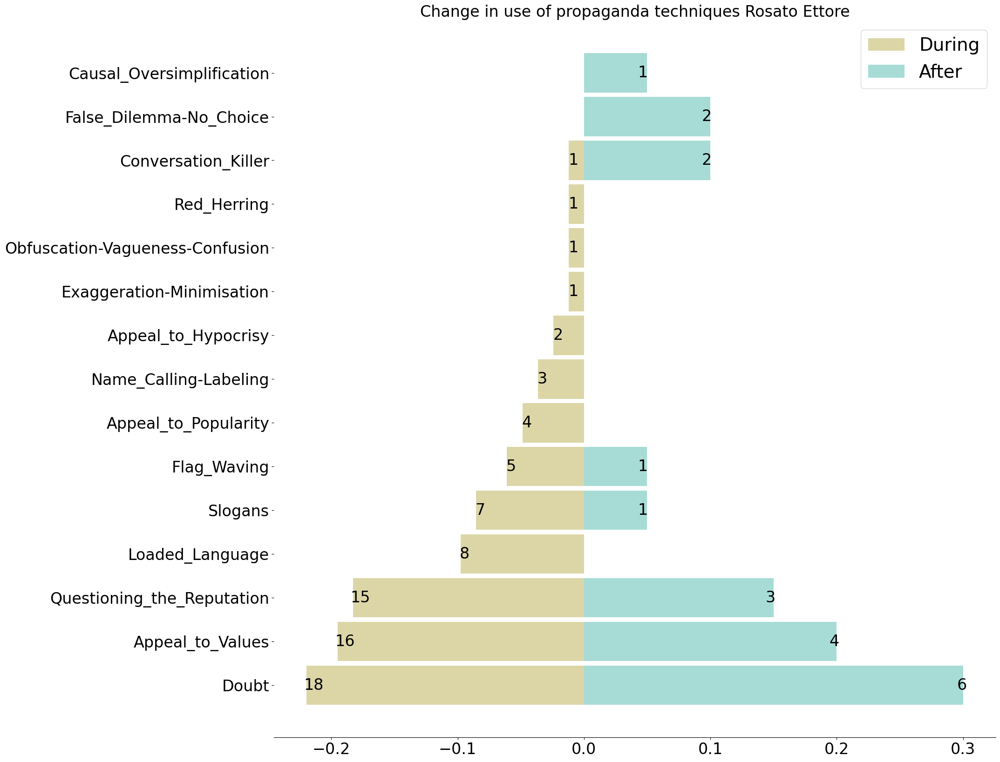

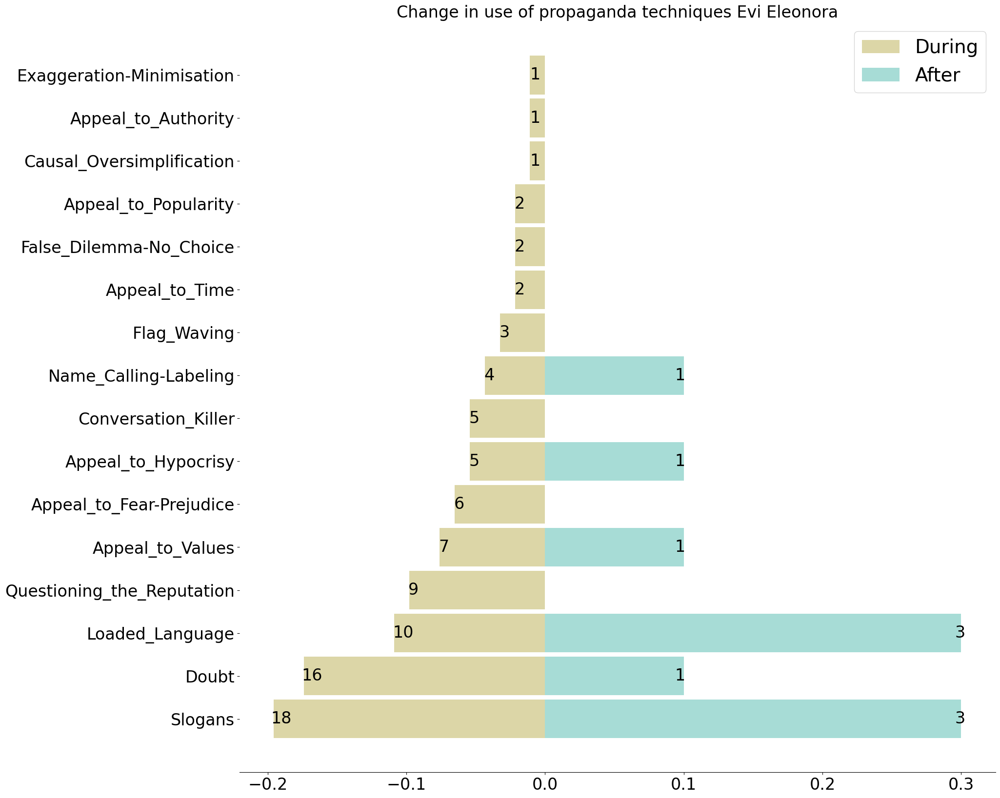

...

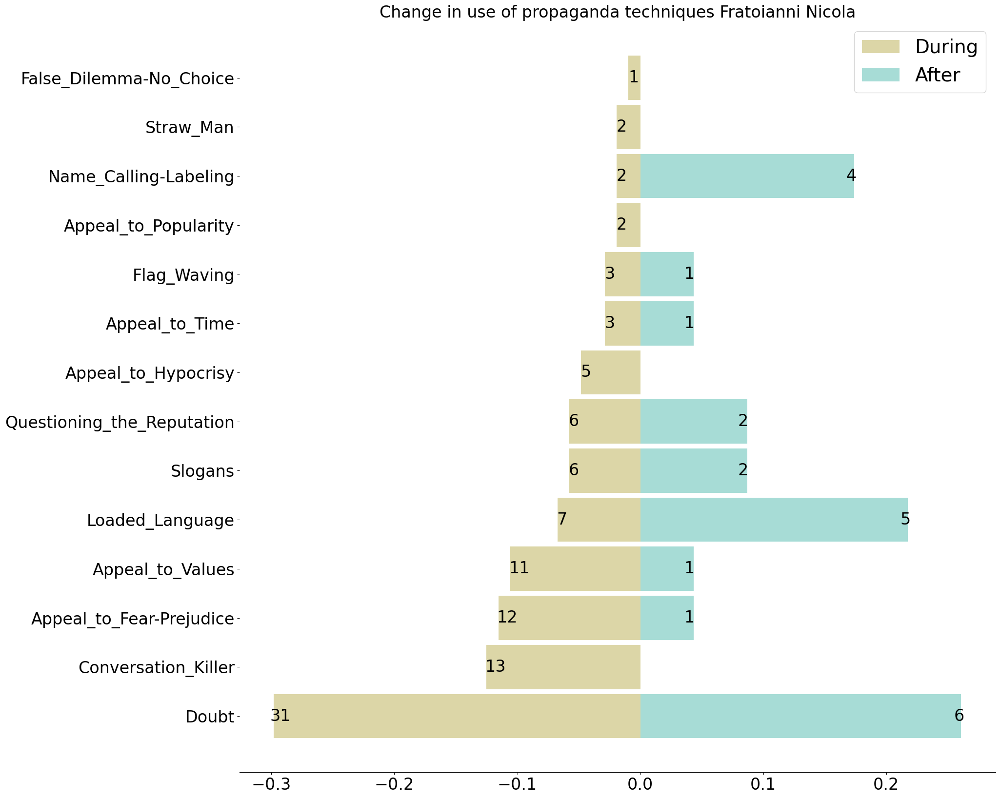

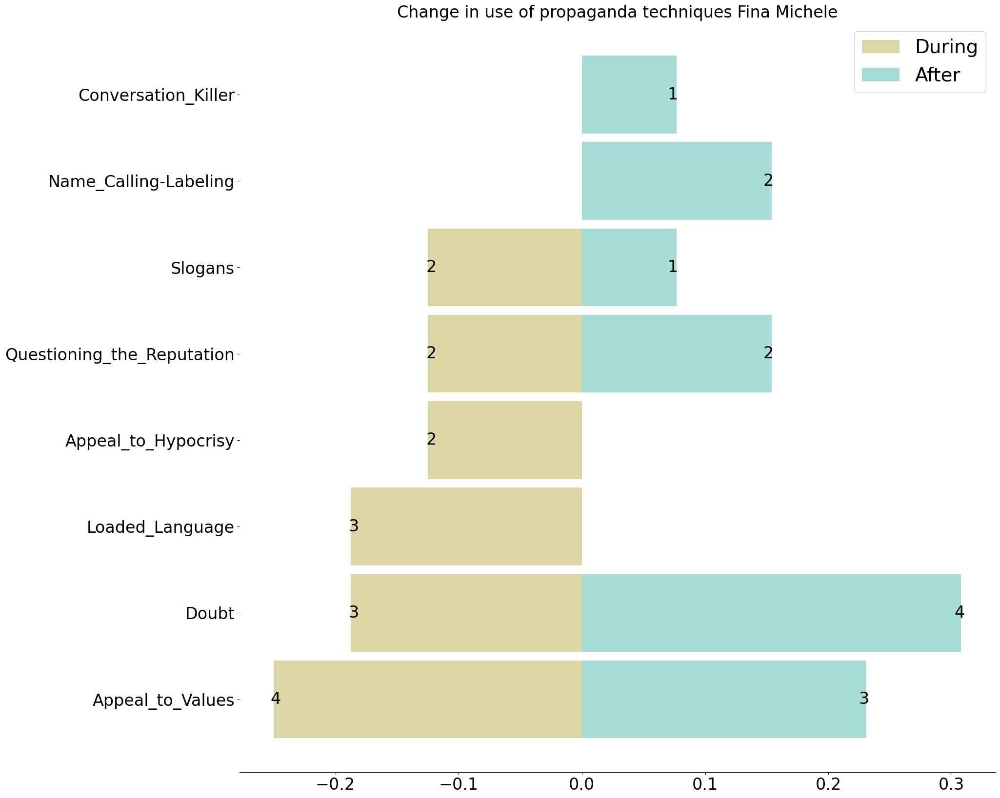

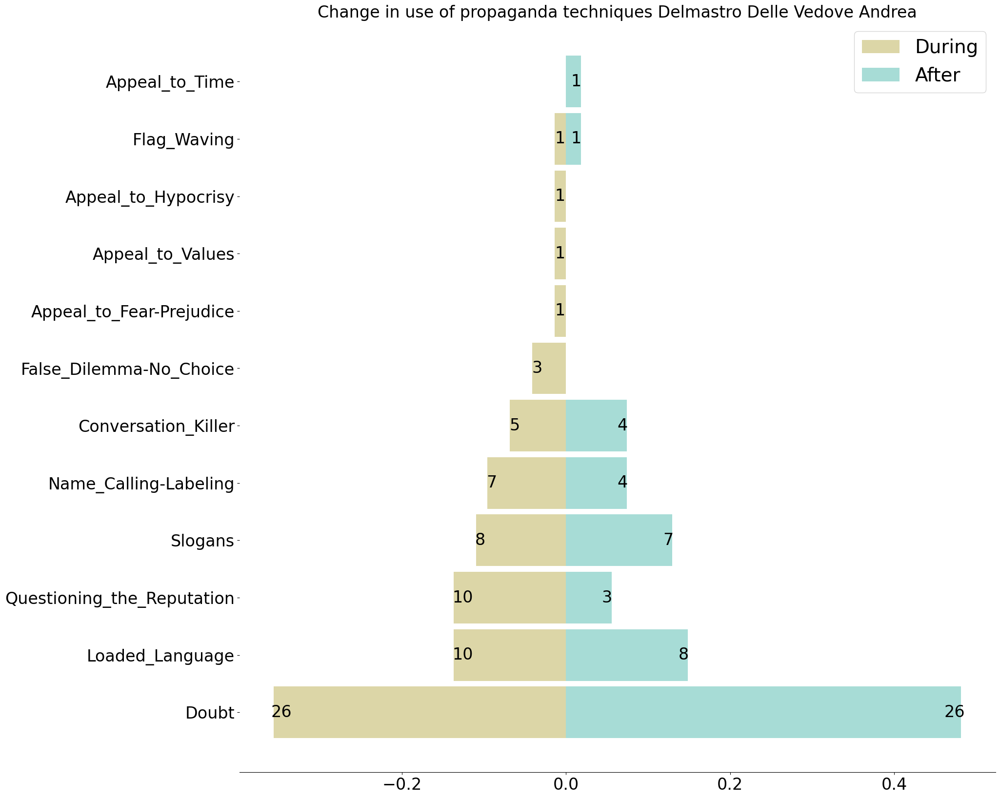

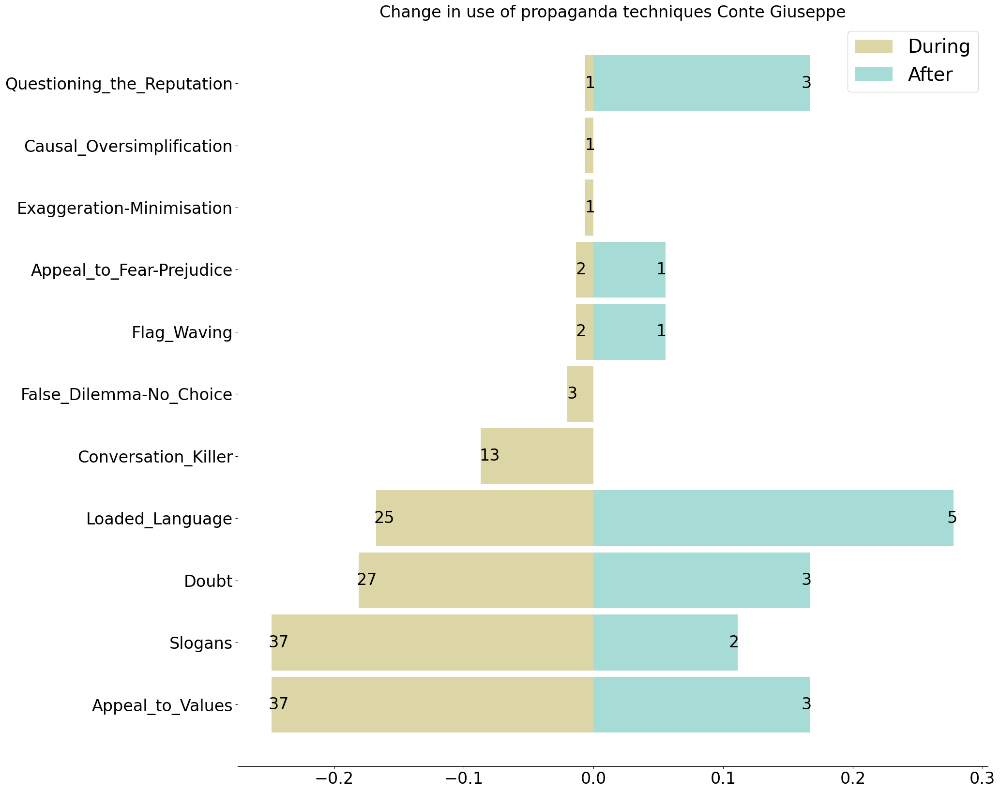

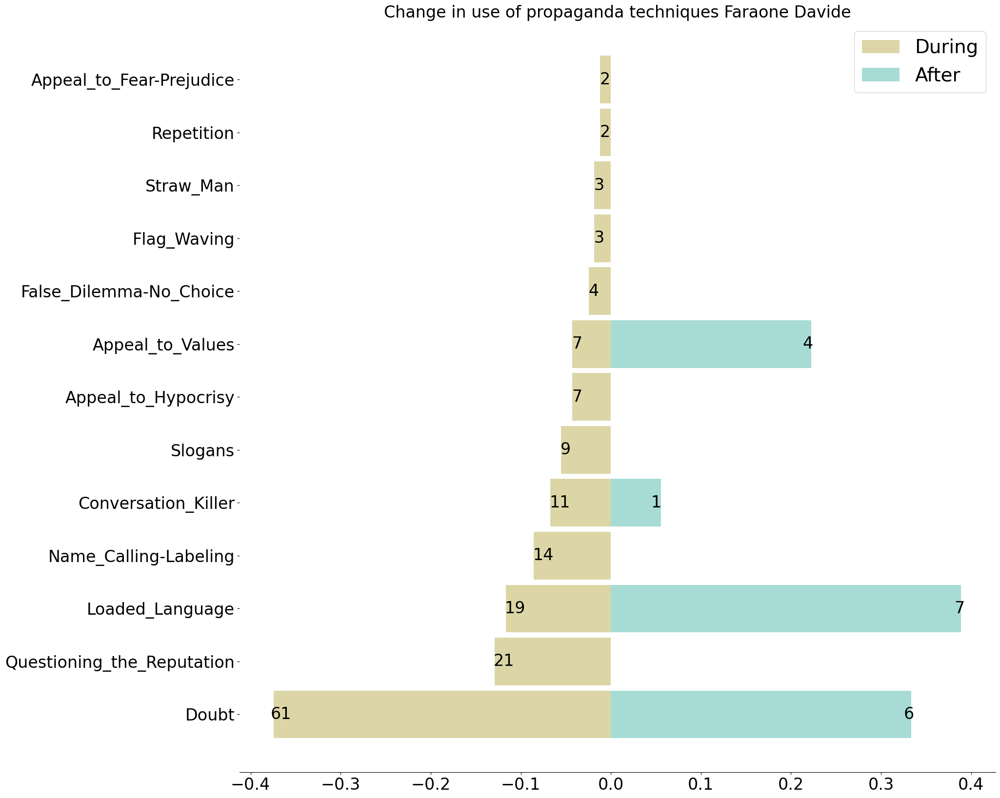

In [31]:
for name in names_interest_da:

    name_annotations_during = df[(df["name"] == name) & (df["period"] == "during")]["annotations"].explode().value_counts()
    name_annotations_after = df[(df["name"] == name) & (df["period"] == "after")]["annotations"].explode().value_counts()

    perc_name_ann_during = name_annotations_during/df[(df["name"] == name) & (df["period"] == "during")]["annotations"].explode().count()
    perc_name_ann_after = name_annotations_after/df[(df["name"] == name) & (df["period"] == "after")]["annotations"].explode().count()

    # Create a figure and axis with a specific size
    fig, ax = plt.subplots(figsize=(20,20))
    
    
    if pre == "Before":
        colorpre = '#BC6DC5'
    else:
        colorpre = '#C5BC6D'

    if post == "During":
        colorpost = '#C5BC6D'
    else:
        colorpost = '#6DC5BC'

    # Create both barplots
    during_bars = ax.barh(perc_name_ann_during.index, -perc_name_ann_during,
                          color=colorpre, alpha=0.6, label=pre, height=0.9)
    after_bars = ax.barh(perc_name_ann_after.index, perc_name_ann_after,
                          color=colorpost, alpha=0.6, label=post, height=0.9)

    # Add annotations at the end of each bar
    for bar, annotations in zip(during_bars, name_annotations_during):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='left', color='black', fontsize=24)

    for bar, annotations in zip(after_bars, name_annotations_after):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='right', color='black', fontsize=24)

    # Removes spines
    ax.spines[['right', 'top', 'left']].set_visible(False)

    # Add a title
    ax.set_title('Change in use of propaganda techniques '+name, fontsize=24)

    # ticks size
    ax.tick_params(axis='y', labelsize=24)
    ax.tick_params(axis='x', labelsize=24)

    plt.legend(fontsize=28)

    # Display the plot
    plt.show()

## Before-after

In [32]:
# representatives that are active both before and during
df_before = df[df['period'] == 'before']
df_after = df[df['period'] == 'after']

# get list of names that are active both before and during
names_before = df_before['name'].unique()
names_after = df_after['name'].unique()

names_interest_ba = ["Renzi Matteo", "Paita Raffaella", "Faraone Davide", 
                     "Provenzano Giuseppe", "Boldrini Laura", "Bonetti Elena",
                     "Conte Giuseppe", "Cottarelli Carlo", "Richetti Matteo",
                     "Soumahoro Aboubakar", "Salvini Matteo", "Calenda Carlo",
                     "Letta Enrico", "Marattin Luigi", "Malan Lucio",
                     "Meloni Giorgia"]


In [33]:
pre = "Before"
post = "After"

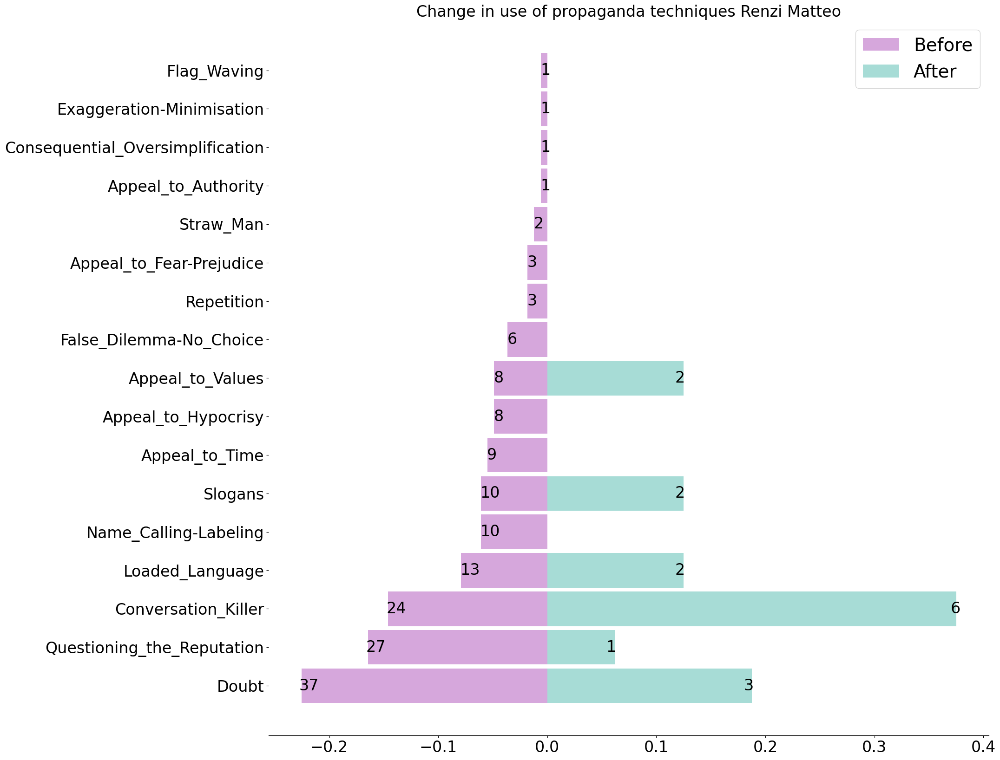

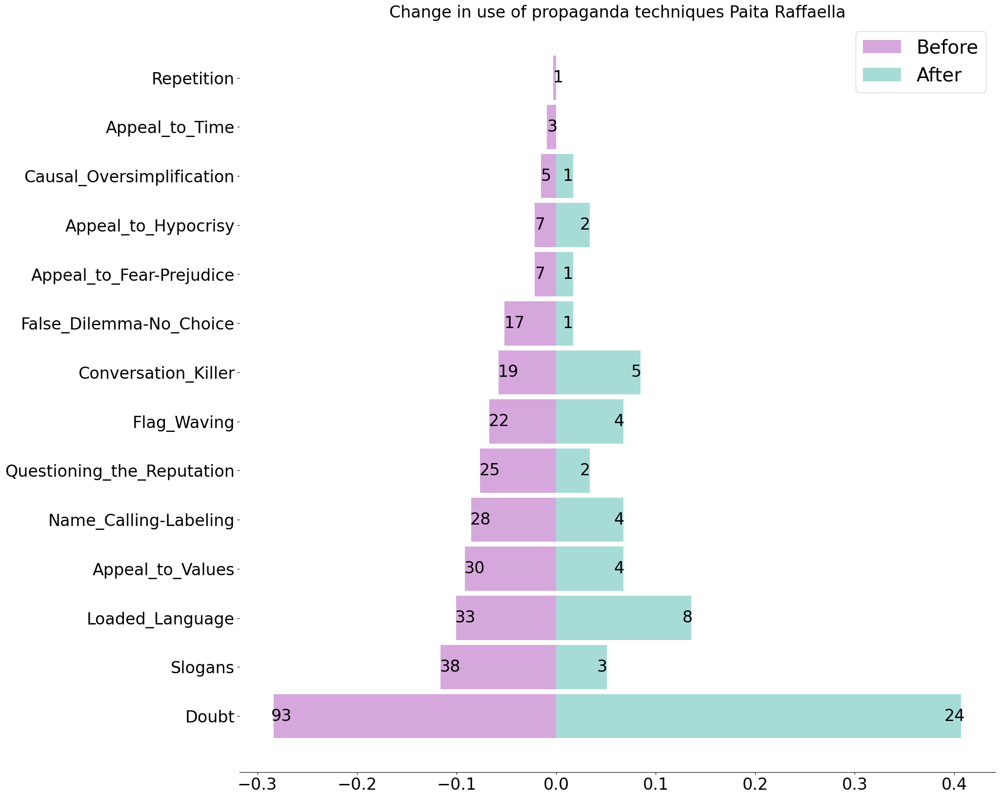

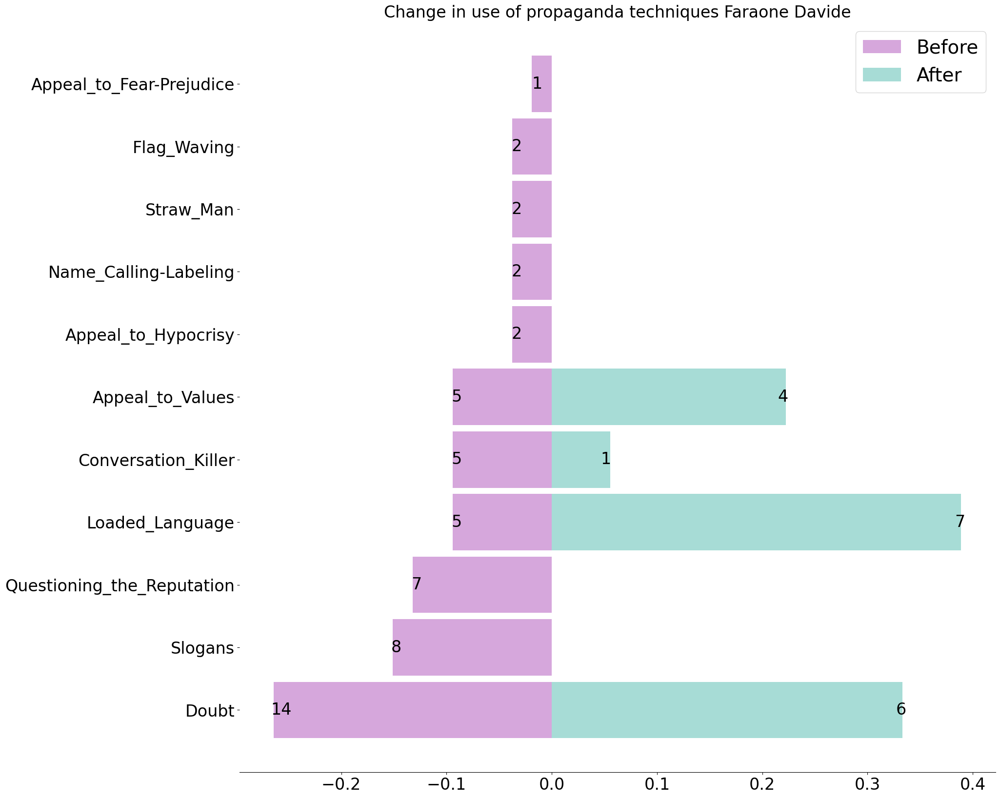

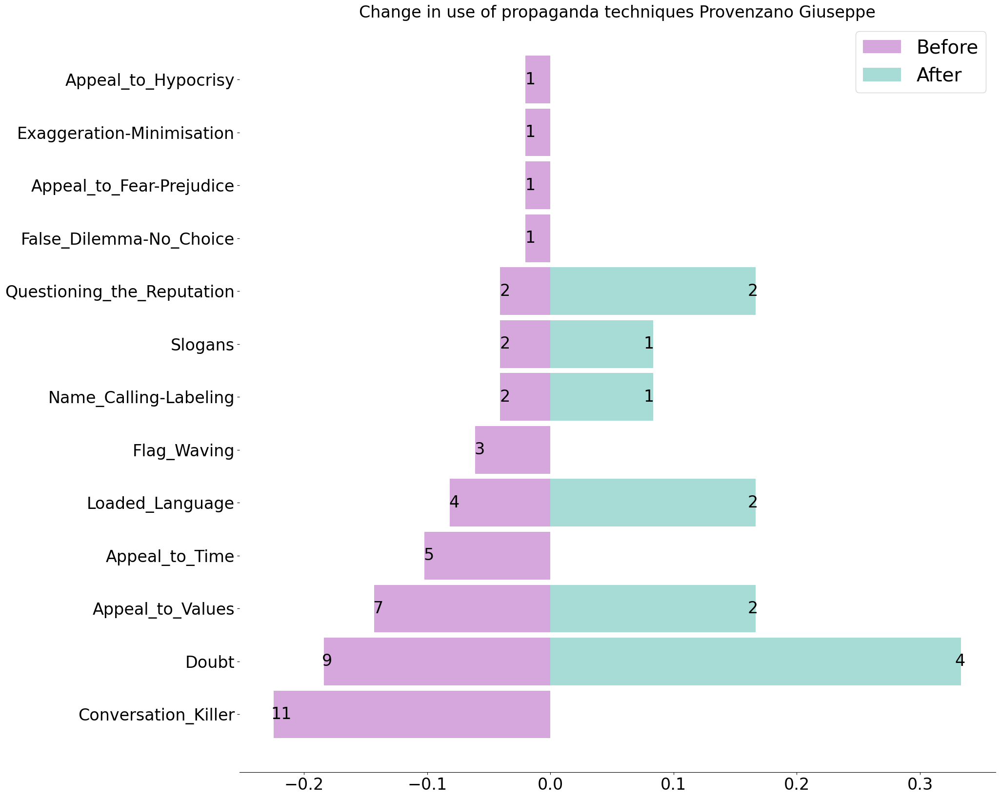

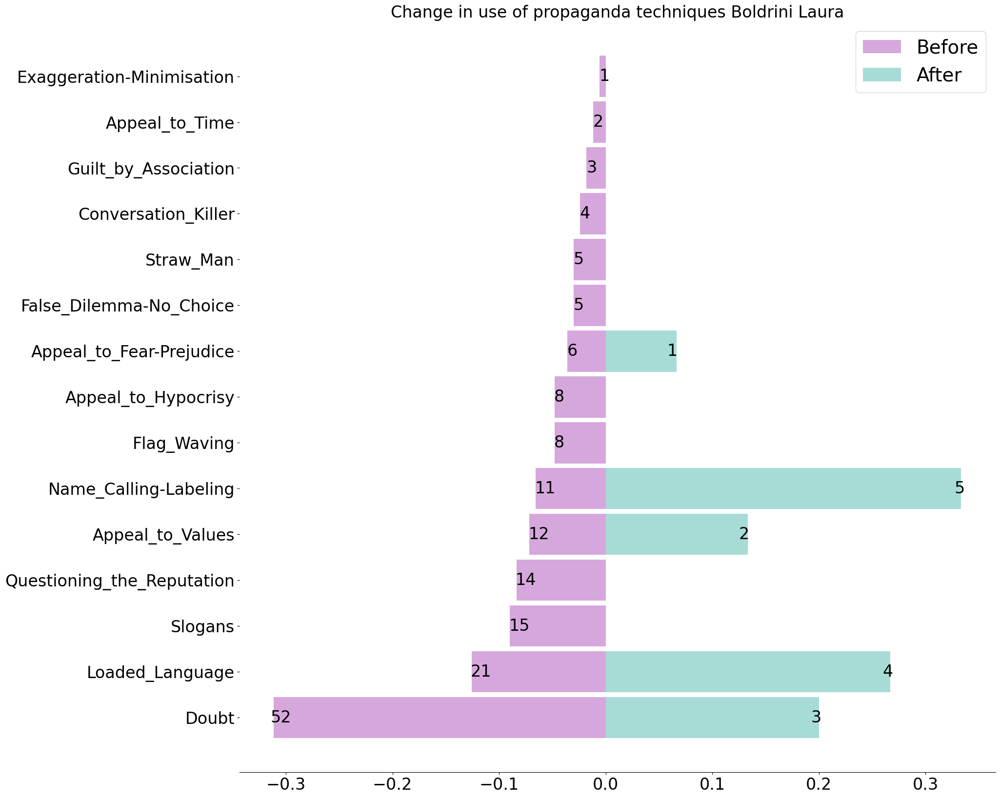

...

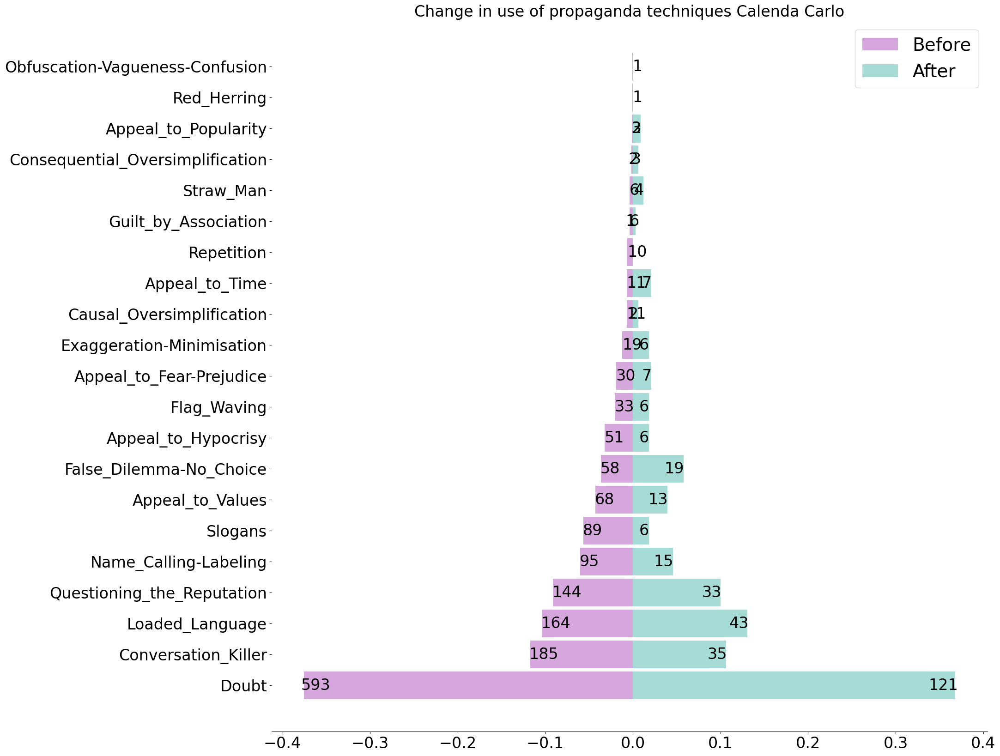

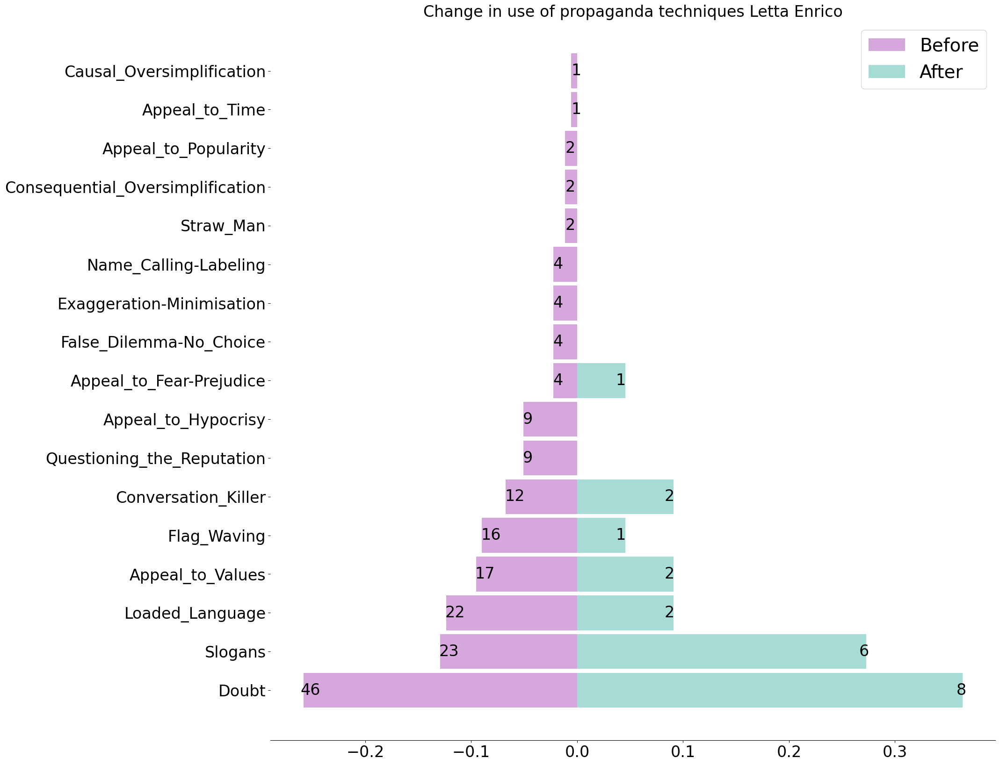

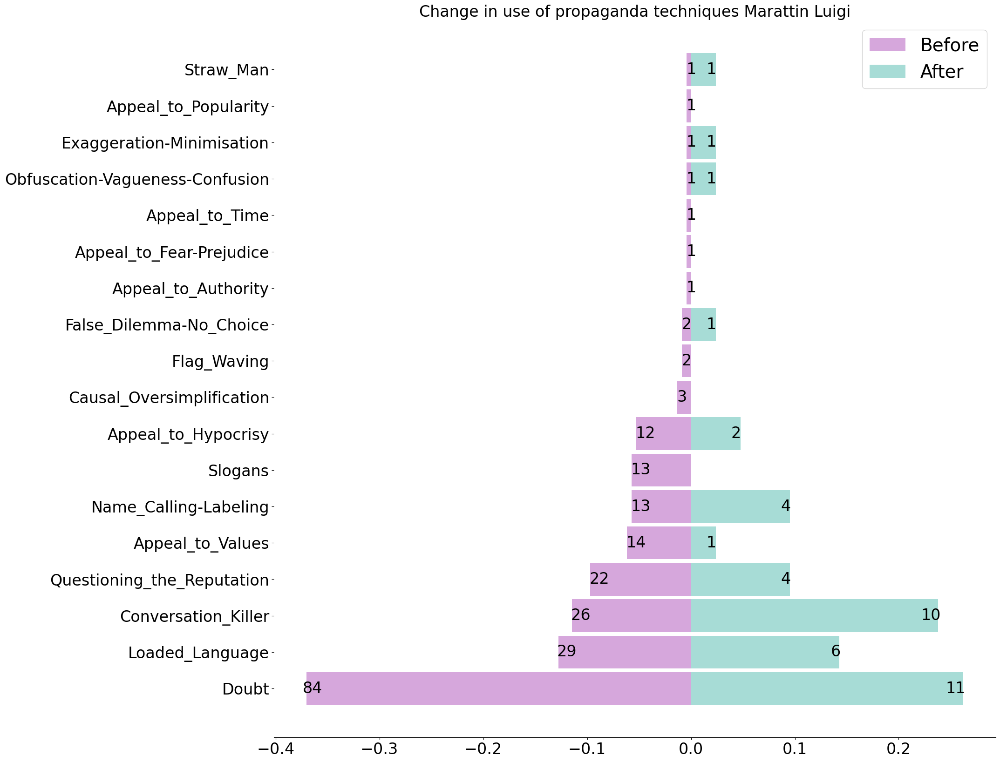

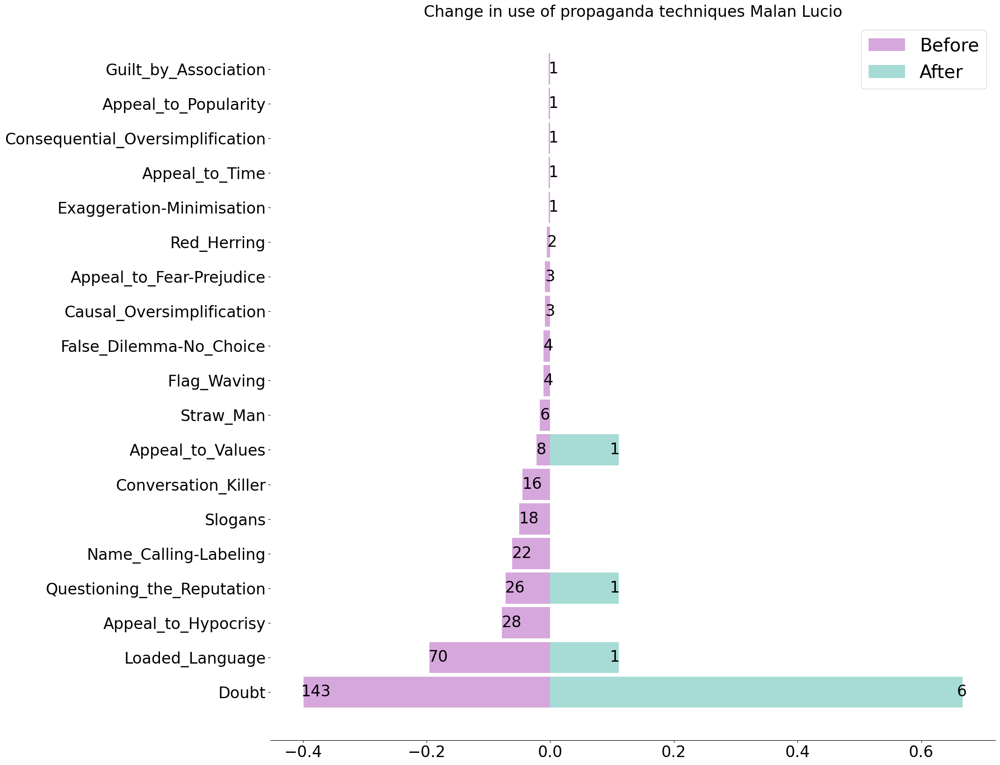

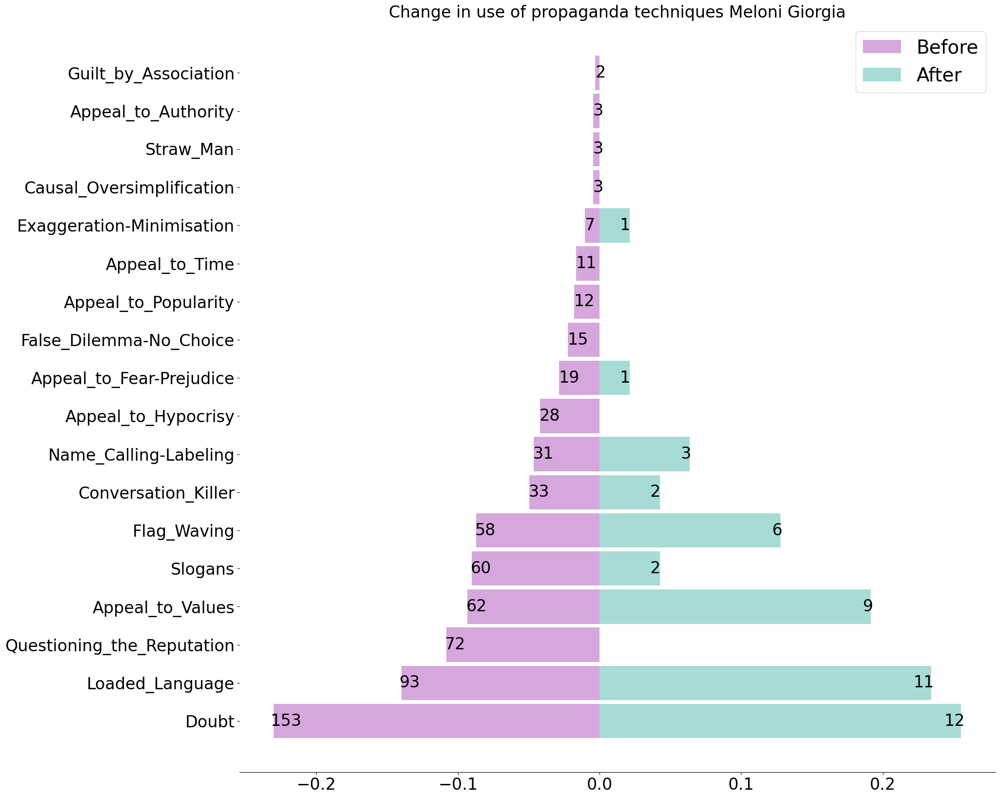

In [35]:
for name in names_interest_ba:

    name_annotations_before = df[(df["name"] == name) & (df["period"] == "before")]["annotations"].explode().value_counts()
    name_annotations_after = df[(df["name"] == name) & (df["period"] == "after")]["annotations"].explode().value_counts()

    perc_name_ann_before = name_annotations_before/df[(df["name"] == name) & (df["period"] == "before")]["annotations"].explode().count()
    perc_name_ann_after = name_annotations_after/df[(df["name"] == name) & (df["period"] == "after")]["annotations"].explode().count()

    # Create a figure and axis with a specific size
    fig, ax = plt.subplots(figsize=(20,20))
    
    if pre == "Before":
        colorpre = '#BC6DC5'
    else:
        colorpre = '#C5BC6D'

    if post == "During":
        colorpost = '#C5BC6D'
    else:
        colorpost = '#6DC5BC'

    # Create both barplots
    before_bars = ax.barh(perc_name_ann_before.index, -perc_name_ann_before,
                          color=colorpre, alpha=0.6, label=pre, height=0.9)
    after_bars = ax.barh(perc_name_ann_after.index, perc_name_ann_after,
                          color=colorpost, alpha=0.6, label=post, height=0.9)

    # Add annotations at the end of each bar
    for bar, annotations in zip(before_bars, name_annotations_before):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='left', color='black', fontsize=24)

    for bar, annotations in zip(after_bars, name_annotations_after):
        ax.text(bar.get_width() * 1.01, bar.get_y() + bar.get_height() / 2, f'{annotations}',
                va='center', ha='right', color='black', fontsize=24)

    # Removes spines
    ax.spines[['right', 'top', 'left']].set_visible(False)

    # Add a title
    ax.set_title('Change in use of propaganda techniques '+name, fontsize=24)

    # ticks size
    ax.tick_params(axis='y', labelsize=24)
    ax.tick_params(axis='x', labelsize=24)

    plt.legend(fontsize=28)

    # Display the plot
    plt.show()